# Juan Carlos Perez Ramirez
## Procesamiento de Lenguaje Natural
## Examen 1: 1: Entre Alhóndigas, Besos y Momias; Crónica de un Examen Anunciado

In [1]:
import pandas as pd
lugares = [
    "alhondiga",
    "mercado_hidalgo",
    "basilica_colegiata",
    "monumento_pipila",
    "callejon_del_beso",
    "museo_de_las_momias",
    "casa_de_diego_rivera",
    "teatro_juarez",
    "jardin_de_la_union",
    "universidad_de_guanajuato"
]

dfs = []
for l in lugares:
    dfs.append(pd.read_csv("../../corpus/opiniones_"+l+".csv", sep=','))

In [2]:
dfs[0]['Sitio'] = 'Alhondiga'
dfs[1]['Sitio'] = 'Mercado Hidalgo'
dfs[2]['Sitio'] = 'Basilica Colegiata'
dfs[3]['Sitio'] = 'Monumento Pipila'
dfs[4]['Sitio'] = 'Callejon del beso'
dfs[5]['Sitio'] = 'Museo de las momias'
dfs[6]['Sitio'] = 'Casa de Diego Rivera'
dfs[7]['Sitio'] = 'Teatro Juarez'
dfs[8]['Sitio'] = 'Jardin de la Union'
dfs[9]['Sitio'] = 'Universidad de Guanajuato'
df = pd.concat(dfs, ignore_index=True)
df.isna().sum()
df = df.dropna()

In [8]:
df.columns

Index(['Género', 'Edad', 'Nacional ó Internacional', 'Calificación', 'Escala',
       'Número de aportaciones', 'Título de la opinión', 'Opinión', 'País',
       'Idioma', 'Dispositivo', 'Fecha', 'Sitio', 'longitud_opinion'],
      dtype='object')

In [7]:
df.head()

,Género,Edad,Nacional ó Internacional,Calificación,Escala,Número de aportaciones,Título de la opinión,Opinión,País,Idioma,Dispositivo,Fecha,Sitio
0,Masculino,59.0,Nacional,Excelente,5,267.0,"""Gran sitio histórico""","""Fue construida a finales del siglo XVIII, en ...",México,Español,Móvil,19/06/2018,Alhondiga
1,Masculino,32.0,Nacional,Excelente,5,61.0,"""Excelente museo""","""Parada obligatoria en tu visita a la ciudad d...",México,Español,PC,19/06/2018,Alhondiga
2,Masculino,18.0,Nacional,Muy bueno,4,50.0,"""Presenciar el lugar de la tragedia""","""En este lugar se dio una de las batallas mas ...",México,Español,PC,05/06/2018,Alhondiga
3,Femenino,30.0,Internacional,Excelente,5,69.0,"""EL CORAZÓN DE LA HISTORIA DE MÉXICO""","""Maravilloso sitio, muy gráfico para aprender ...",Perú,Español,PC,03/06/2018,Alhondiga
4,Femenino,25.0,Nacional,Excelente,5,22.0,"""Viaje diver-cultural!!""","""El término alhóndiga proviene del árabe y sig...",México,Español,PC,29/05/2018,Alhondiga


# Estadisticas
## Promedio y desviacion estandar de calificaciones

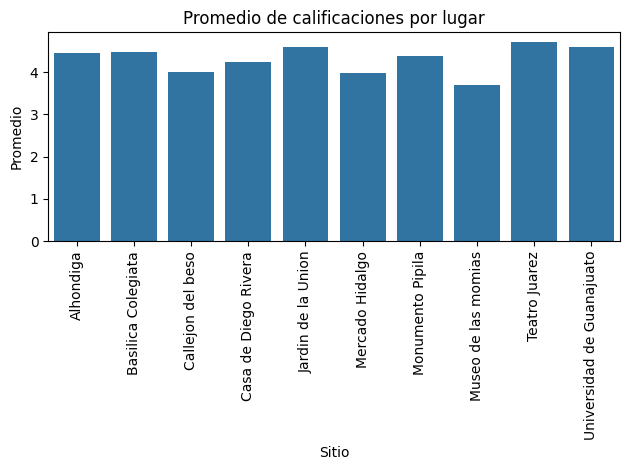

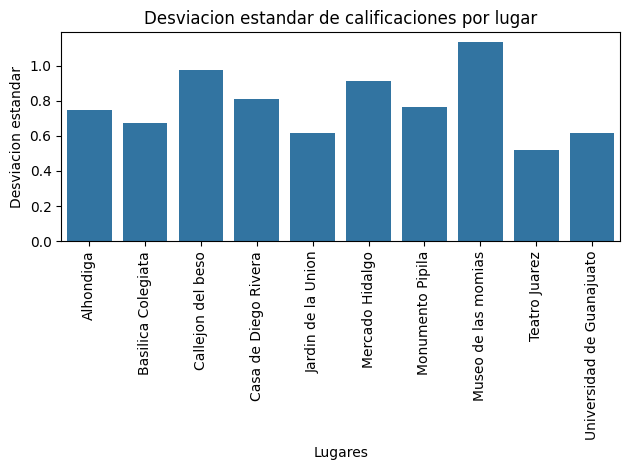

In [3]:
import seaborn as sns
import matplotlib.pyplot as plt
means = df.groupby('Sitio')['Escala'].mean()
sns.barplot(x=means.index, y=means.values)
plt.title('Promedio de calificaciones por lugar')
plt.xticks(rotation=90)
plt.xlabel('Sitio')
plt.ylabel('Promedio')
plt.tight_layout()
plt.show()

stds = df.groupby('Sitio')['Escala'].std()
sns.barplot(x=stds.index, y=stds.values)
plt.title('Desviacion estandar de calificaciones por lugar')
plt.xlabel('Lugares')
plt.xticks(rotation=90)
plt.ylabel('Desviacion estandar')
plt.tight_layout()
plt.show()

## Longitud promedio de opiniones y desviacion estandar (por palabras)

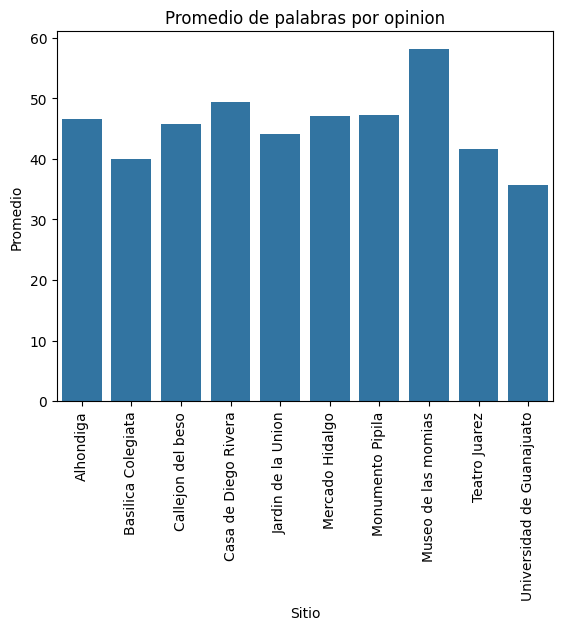

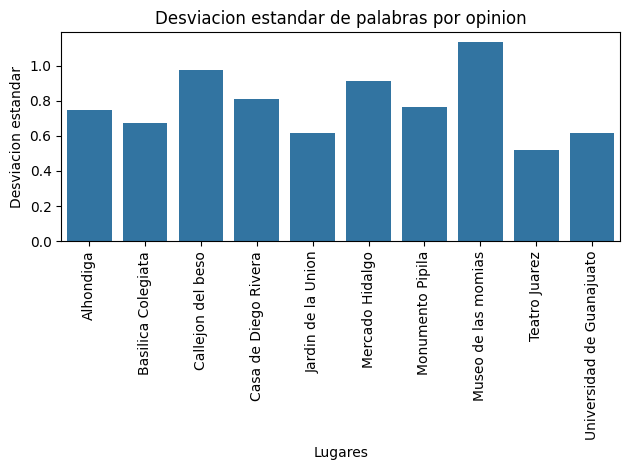

In [4]:
df['Opinión'] = df['Opinión'].str.replace(r'^["\']|["\']$', '', regex=True)
df['longitud_opinion'] = df['Opinión'].apply(lambda x: len(x.split()))
means_ops = df.groupby('Sitio')['longitud_opinion'].mean()
sns.barplot(x=means_ops.index, y=means_ops.values)
plt.title('Promedio de palabras por opinion')
plt.ylabel('Promedio')
plt.xticks(rotation=90)
plt.show()

stds_ops = df.groupby('Sitio')['Escala'].std()
sns.barplot(x=stds_ops.index, y=stds_ops.values)
plt.title('Desviacion estandar de palabras por opinion')
plt.xlabel('Lugares')
plt.xticks(rotation=90)
plt.ylabel('Desviacion estandar')
plt.tight_layout()
plt.show()

## Histograma de edades de opiniones por lugar

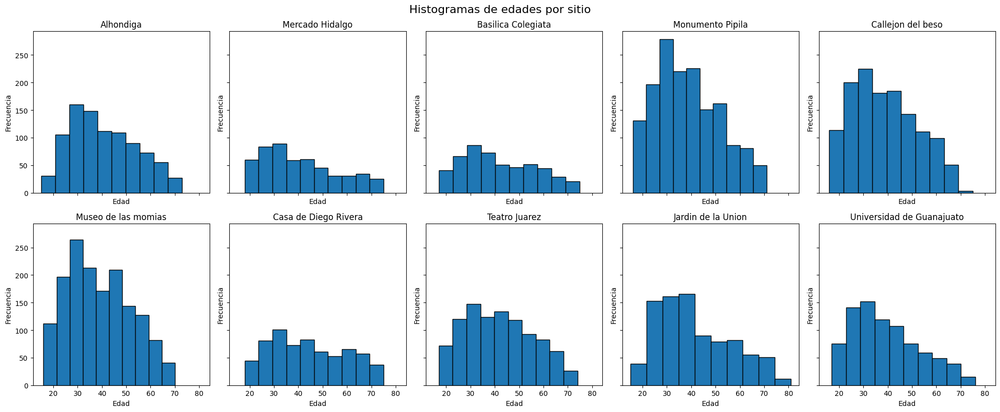

In [5]:
sitios = df['Sitio'].unique()
fig, axes = plt.subplots(2, 5, figsize=(20, 8), sharex=True, sharey=True)
axes = axes.flatten()  # aplanamos para indexar fácilmente

for i, sitio in enumerate(sitios):
    datos_sitio = df[df['Sitio'] == sitio]['Edad']
    axes[i].hist(datos_sitio, bins=10, edgecolor='black')
    axes[i].set_title(sitio)
    axes[i].set_xlabel('Edad')
    axes[i].set_ylabel('Frecuencia')

# Ajustar el layout para que no se sobrepongan los elementos
plt.tight_layout()
plt.suptitle('Histogramas de edades por sitio', fontsize=16, y=1.02)
plt.show()



## Histograma de tipo de visitante por lugar

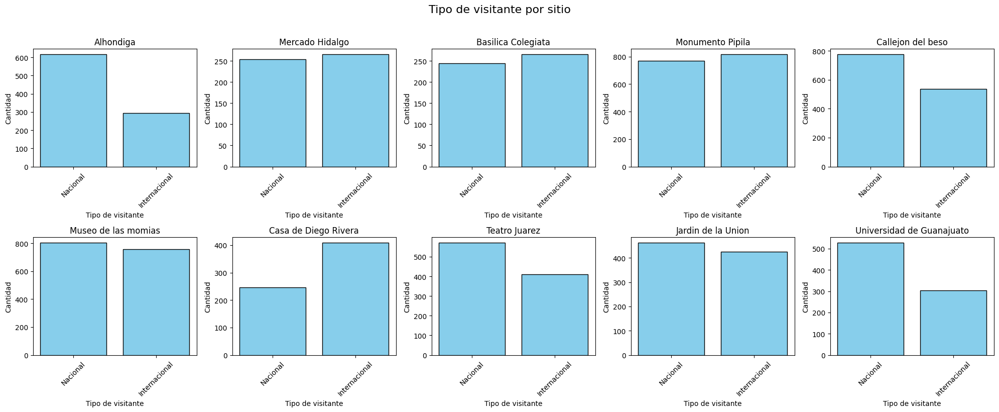

In [49]:
orden_visitantes = ['Nacional', 'Internacional']

fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()

for i, sitio in enumerate(sitios):
    conteo = df[df['Sitio'] == sitio]['Nacional ó Internacional'].value_counts()

    # Asegurar orden fijo (rellena con 0 si falta alguno)
    conteo = conteo.reindex(orden_visitantes, fill_value=0)

    axes[i].bar(conteo.index, conteo.values, color='skyblue', edgecolor='black')
    axes[i].set_title(sitio)
    axes[i].set_xlabel('Tipo de visitante')
    axes[i].set_ylabel('Cantidad')
    axes[i].tick_params(axis='x', rotation=45)

plt.suptitle('Tipo de visitante por sitio', fontsize=16, y=1.02)
plt.tight_layout()
plt.show()


## Promedio y desviacion estandar del numero de aportaciones por tipo de visitante

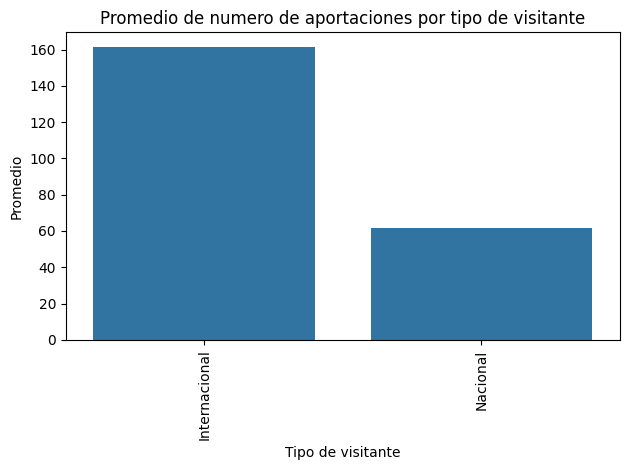

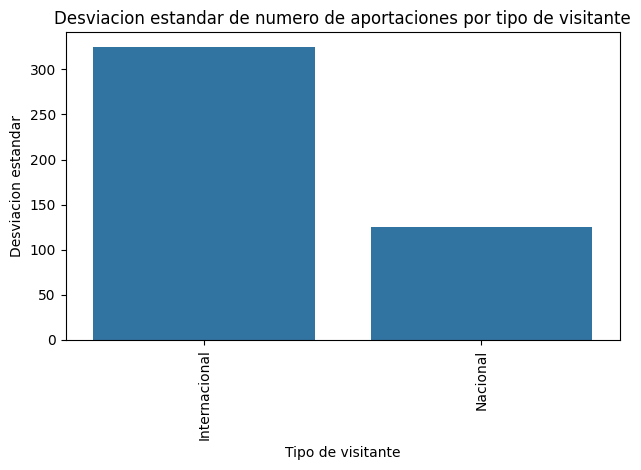

In [50]:
import seaborn as sns
import matplotlib.pyplot as plt
means_ap = df.groupby('Nacional ó Internacional')['Número de aportaciones'].mean()
sns.barplot(x=means_ap.index, y=means_ap.values)
plt.title('Promedio de numero de aportaciones por tipo de visitante')
plt.xticks(rotation=90)
plt.xlabel('Tipo de visitante')
plt.ylabel('Promedio')
plt.tight_layout()
plt.show()

stds_ap = df.groupby('Nacional ó Internacional')['Número de aportaciones'].std()
sns.barplot(x=stds_ap.index, y=stds_ap.values)
plt.title('Desviacion estandar de numero de aportaciones por tipo de visitante')
plt.xlabel('Tipo de visitante')
plt.xticks(rotation=90)
plt.ylabel('Desviacion estandar')
plt.tight_layout()
plt.show()

## Promedio y desviacion estandar de la cantidad de aportaciones por grupo de edad

/tmp/ipykernel_7354/2007577644.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Grupo de edad'] = pd.cut(df['Edad'], bins=bins, labels=labels, right=False)
/tmp/ipykernel_7354/2007577644.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  means_ap = df.groupby('Grupo de edad')['Número de aportaciones'].mean()


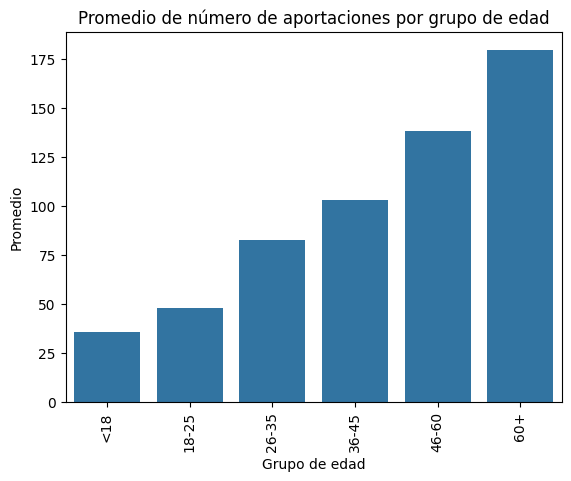

/tmp/ipykernel_7354/2007577644.py:13: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  stds_ap = df.groupby('Grupo de edad')['Número de aportaciones'].std()


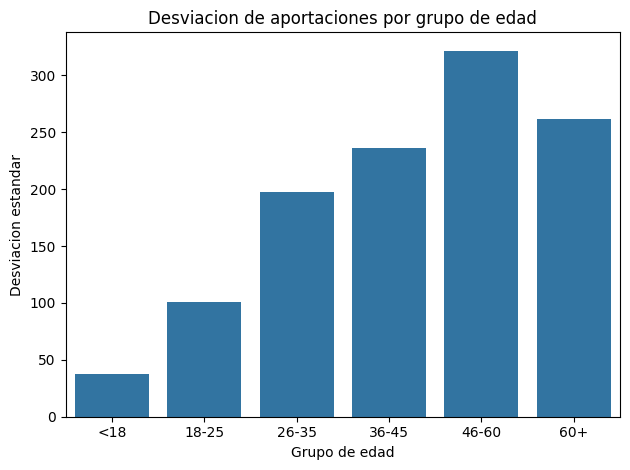

In [52]:
bins = [0, 18, 25, 35, 45, 60, 100]
labels = ['<18', '18-25', '26-35', '36-45', '46-60', '60+']
df['Grupo de edad'] = pd.cut(df['Edad'], bins=bins, labels=labels, right=False)

means_ap = df.groupby('Grupo de edad')['Número de aportaciones'].mean()
sns.barplot(x=means_ap.index, y=means_ap.values)
plt.title('Promedio de número de aportaciones por grupo de edad')
plt.xlabel('Grupo de edad')
plt.ylabel('Promedio')
plt.xticks(rotation=90)
plt.show()

stds_ap = df.groupby('Grupo de edad')['Número de aportaciones'].std()
sns.barplot(x=stds_ap.index, y=stds_ap.values)
plt.title('Desviacion de aportaciones por grupo de edad')
plt.xlabel('Grupo de edad')
#plt.xticks(rotation=90)
plt.ylabel('Desviacion estandar')
plt.tight_layout()
plt.show()

# WordCloud
## TD-IDF
### Separacion de datos

In [21]:
sitios = df['Sitio'].unique()
# Diccionario para guardar los conjuntos separados por sitio
splits_por_sitio = {}

for sitio in sitios:
    # Filtrar opiniones y etiquetas para ese sitio
    X = df[df['Sitio'] == sitio]['Opinión']
    y = df[df['Sitio'] == sitio]['Sitio']
    
    # Guardar los conjuntos en un diccionario
    splits_por_sitio[sitio] = {
        'X': X,
        'y': y
    }


### Construccion de vocabulario

In [35]:
from sklearn.feature_extraction.text import TfidfVectorizer
import nltk
from nltk.corpus import stopwords
from sklearn.feature_selection import SelectKBest, chi2
from wordcloud import WordCloud
import matplotlib.pyplot as plt

nltk.download('stopwords')
all_stopwords = stopwords.words('spanish') + stopwords.words('english')

# Preparar datos globales
X_global = pd.concat([splits_por_sitio[sitio]['X'] for sitio in splits_por_sitio])
y_global = pd.concat([splits_por_sitio[sitio]['y'] for sitio in splits_por_sitio])

# Vectorizar textos (generar matriz TF-IDF)
vectorizer = TfidfVectorizer(stop_words=all_stopwords, max_features=10000)
X_tfidf = vectorizer.fit_transform(X_global)

[nltk_data] Downloading package stopwords to
[nltk_data]     /home/juancho/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


## WordClouds

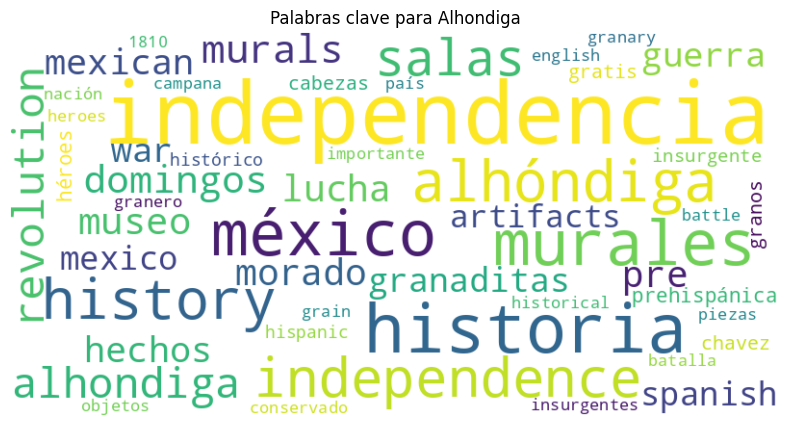

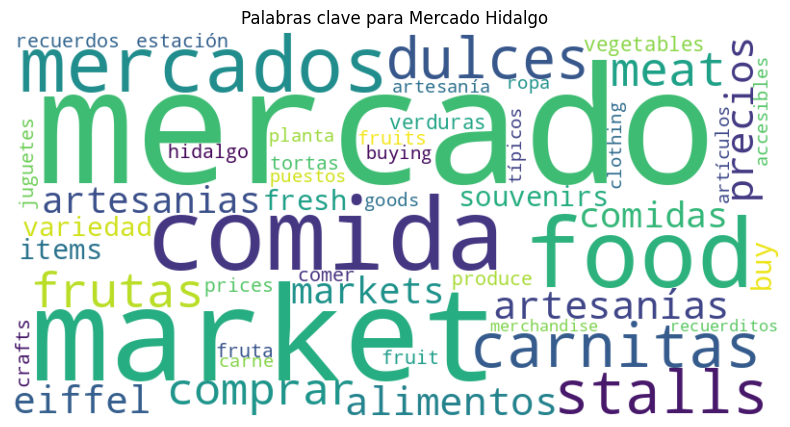

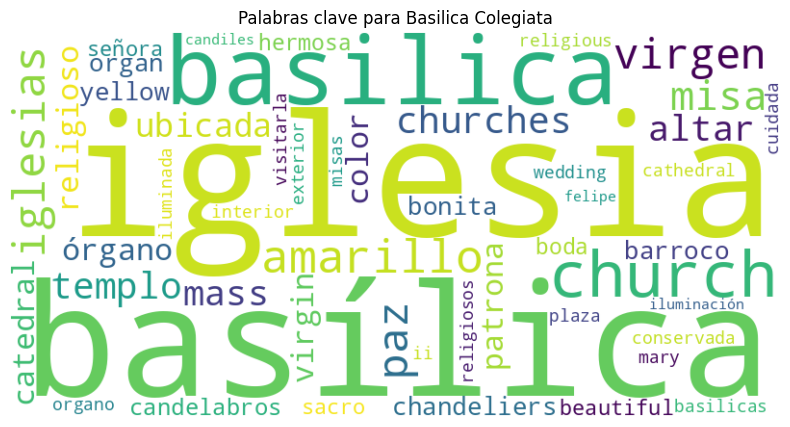

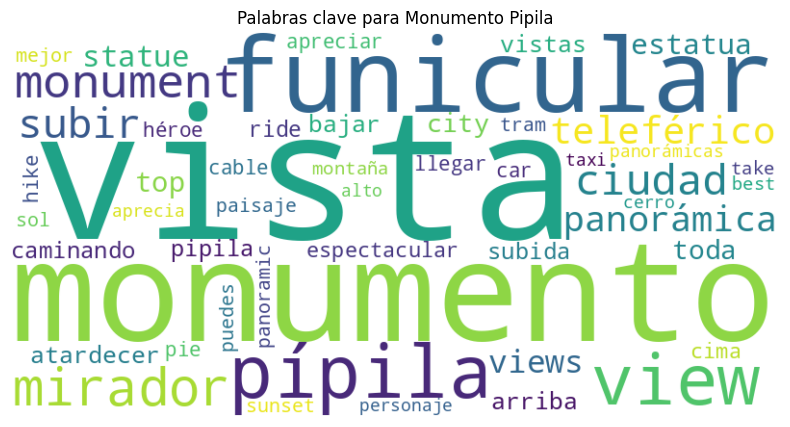

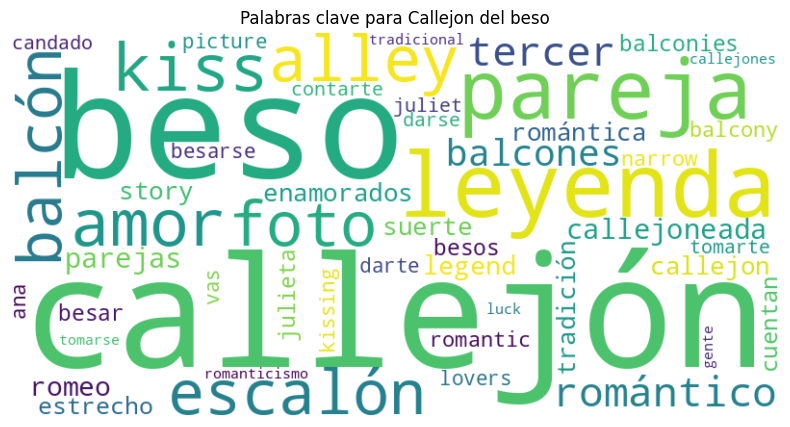

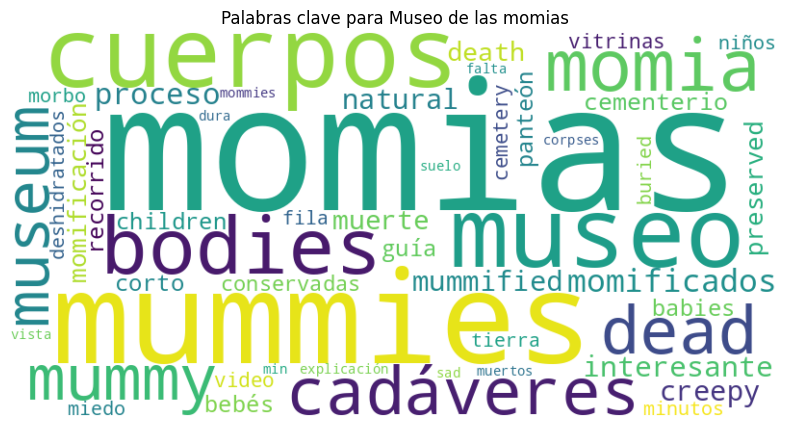

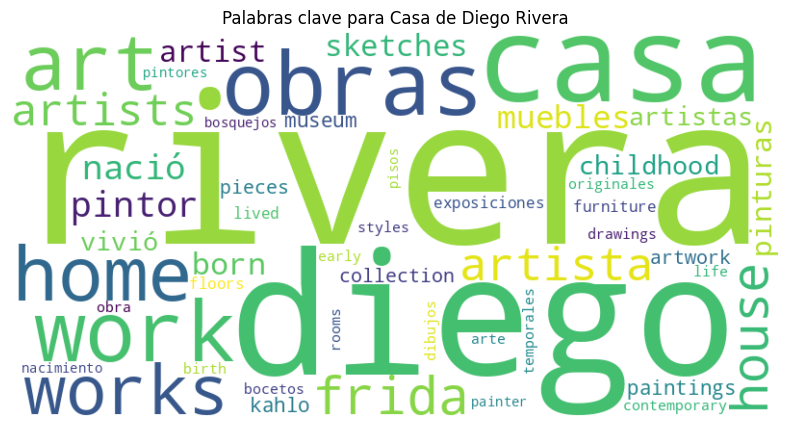

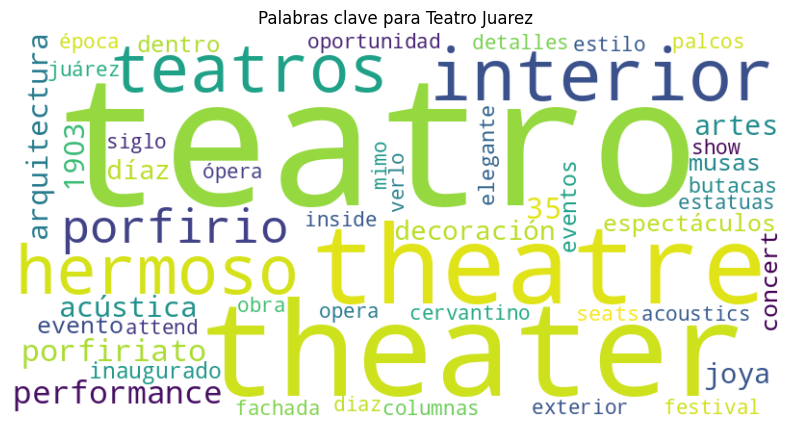

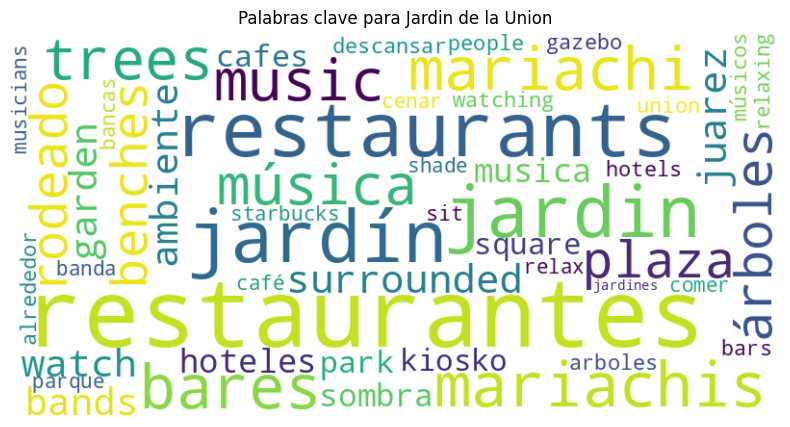

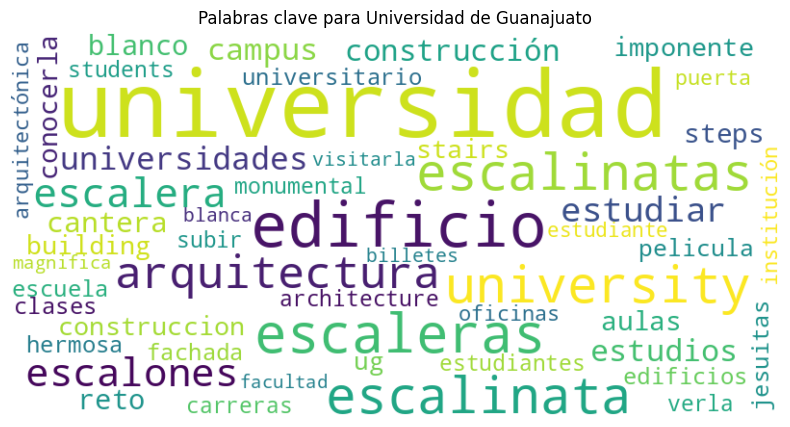

In [36]:
# Generar WordCloud para cada sitio
for sitio in sitios:
    # Variable binaria: 1 si el documento es del sitio actual, 0 si no
    y_binaria = (y_global == sitio).astype(int)

    # Selección de las 50 palabras más relevantes para este sitio
    selector = SelectKBest(chi2, k=50)
    selector.fit(X_tfidf, y_binaria)

    # Extraer palabras seleccionadas y sus scores
    mask = selector.get_support()
    features = vectorizer.get_feature_names_out()[mask]
    scores = selector.scores_[mask]
    word_scores = dict(zip(features, scores))

    # Generar y mostrar la WordCloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_scores)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Palabras clave para {sitio}')
    plt.show()


# LSA
Se crean las separaciones de los datos segun el subgrupo al que pertenece la persona que dejo la opinion y el sitio que visito.

Por la forma de los histogramas de las personas que visitan cada sitio segun su edad, se decidio dividir a jovenes y mayores a partir de los 30 anos, dado que esta es la edad de las personas que mas dejan opiniones sobre estos sitios.

In [48]:
from sklearn.decomposition import TruncatedSVD

def show_top_words(k, vectorizer, top_n=3):
    palabras = vectorizer.get_feature_names_out()
    top_palabras = []
    for i, comp in enumerate(k):
        palabras_indices = comp.argsort()[-top_n:][::-1]
        top = [palabras[j] for j in palabras_indices]
        top_palabras.append((f"Tópico {i+1}", top))
    return top_palabras

df_global_indices = X_global.index.to_list()  # para mapear después
results = {}
for sitio in sitios:
    results[sitio] = {}
    subgrupos = {
        'Hombres': df[(df['Género'] == 'Masculino') & (df['Sitio'] == sitio)],
        'Mujeres': df[(df['Género'] == 'Femenino') & (df['Sitio'] == sitio)],
        'Nacionales': df[(df['Nacional ó Internacional'] == 'Nacional') & (df['Sitio'] == sitio)],
        'Internacionales': df[(df['Nacional ó Internacional'] == 'Internacional') & (df['Sitio'] == sitio)],
        'Jóvenes': df[(df['Edad'] < 30) & (df['Sitio'] == sitio)],
        'Mayores': df[(df['Edad'] >= 30) & (df['Sitio'] == sitio)]
    }
    for subgrupo, opiniones in subgrupos.items():
        if len(opiniones) < 5:
            continue  # Opcional: para evitar errores con pocos datos

        # Convertir índices originales a posicionales
        idx = [df_global_indices.index(i) for i in opiniones.index if i in df_global_indices]
        X_tfidf_subgrupo = X_tfidf[idx]

        lsa = TruncatedSVD(n_components=3, random_state=42)
        lsa.fit(X_tfidf_subgrupo)
        top_words = show_top_words(lsa.components_, vectorizer, top_n=10)
        results[sitio][subgrupo] = top_words


Para mostrar la importancia de cada palabra en los topicos, se hicieron wordclouds que dan una idea sobre a que se refiere cada uno: por ejemplo, para el caso de la Alhondiga, los primeros dos topicos mas importantes entre los hombres tratan el aspecto historico del edificio, primero entre los visitantes nacionales (en espanol) y luego entre los internacionales (en ingles); por su parte, entre las mujeres, los dos topicos mas importantes es el papel del edificio como museo hablando sobre los murales que contiene, una vez mas primero entre las visitantes nacionales y en segundo lugar entre las internacionales.

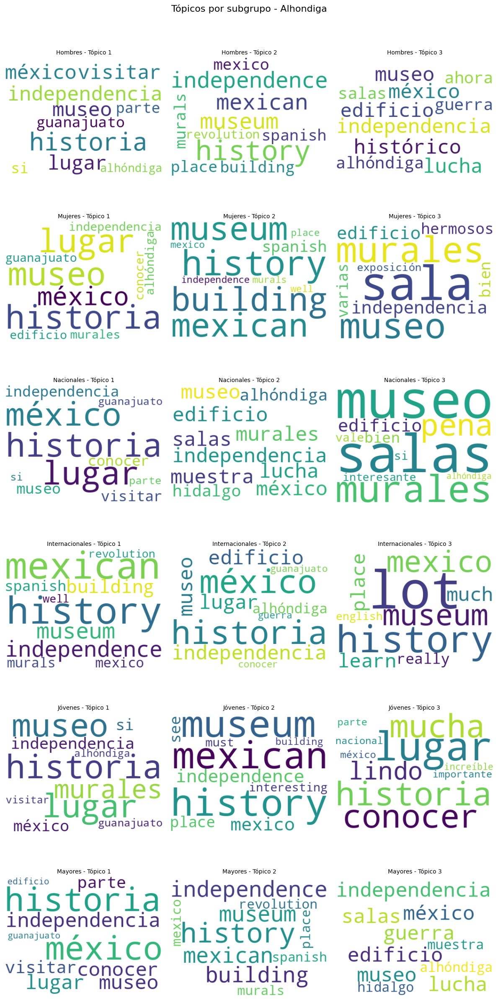

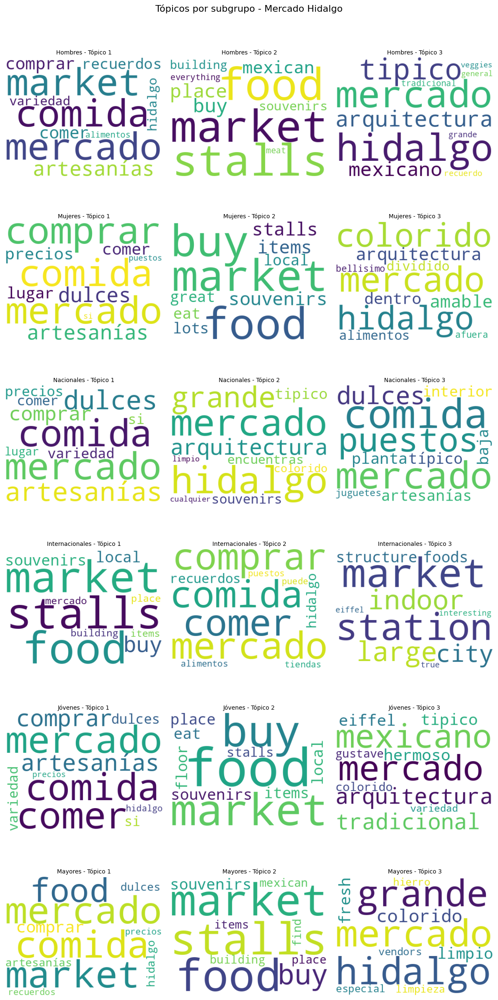

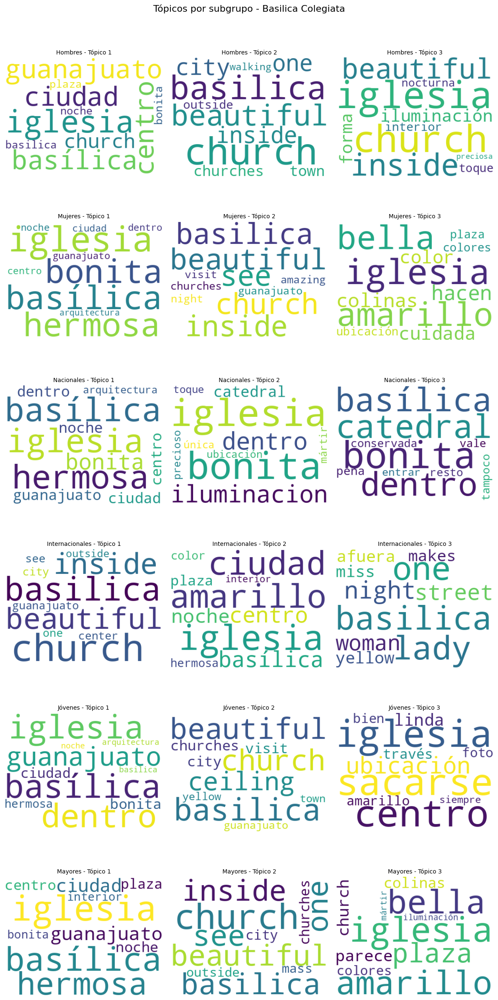

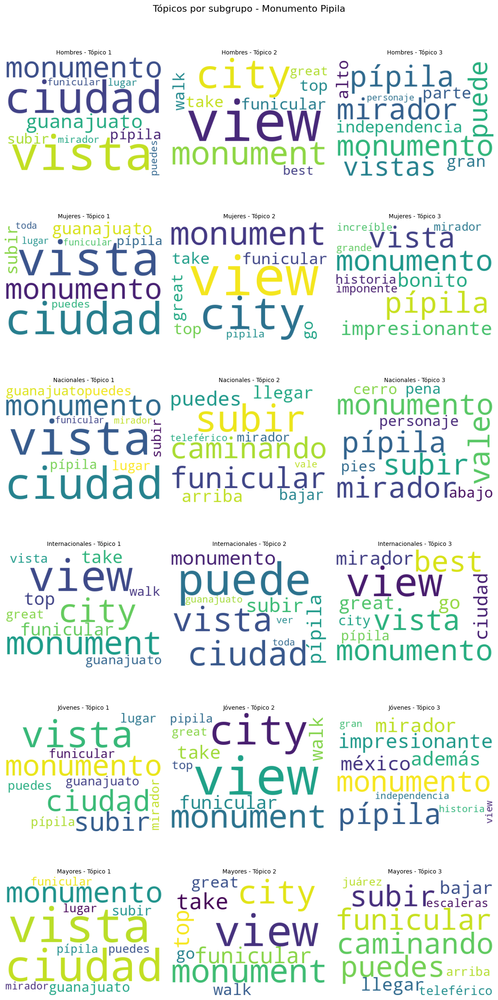

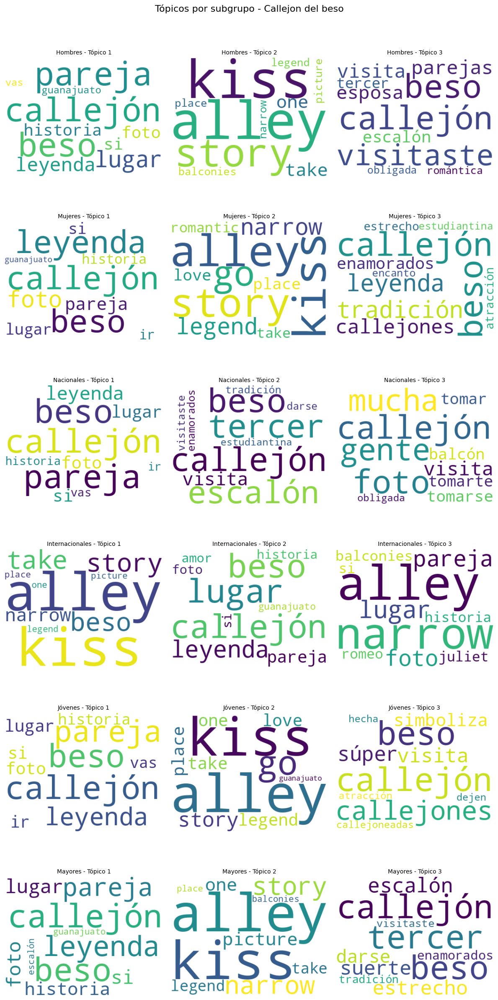

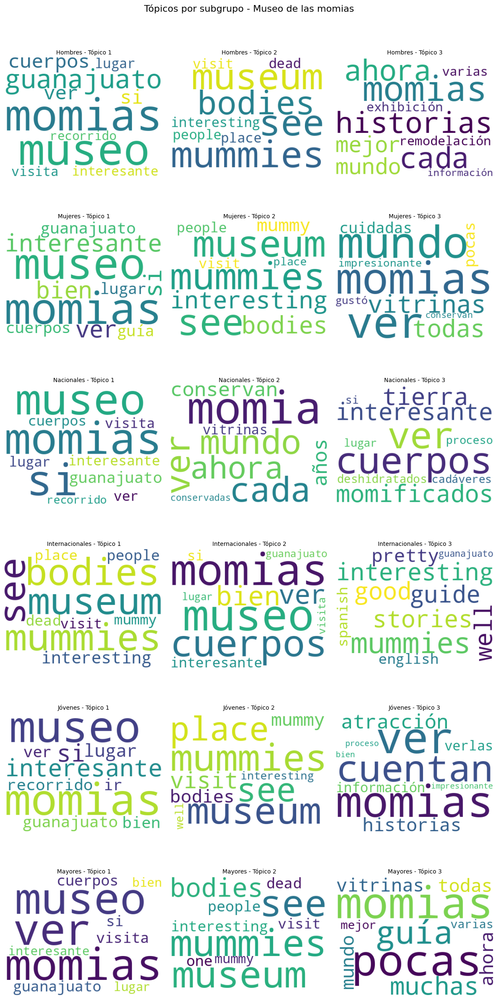

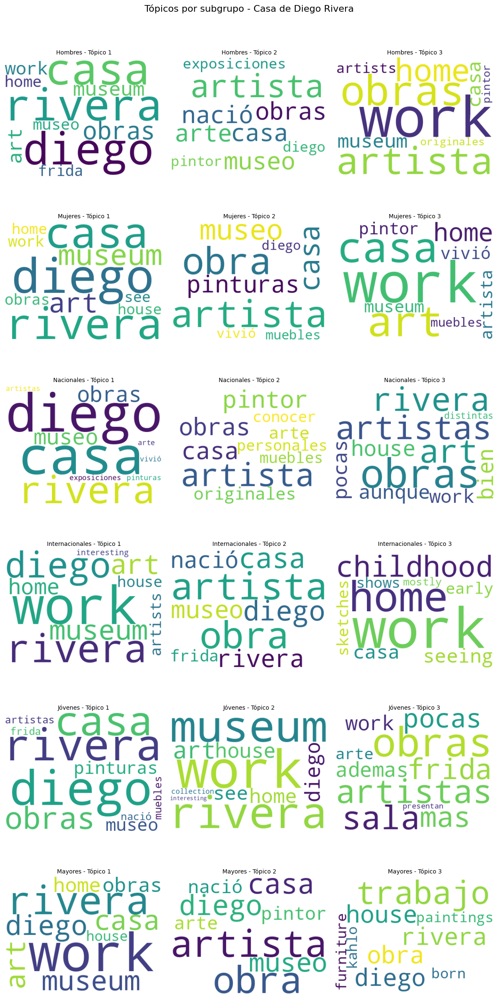

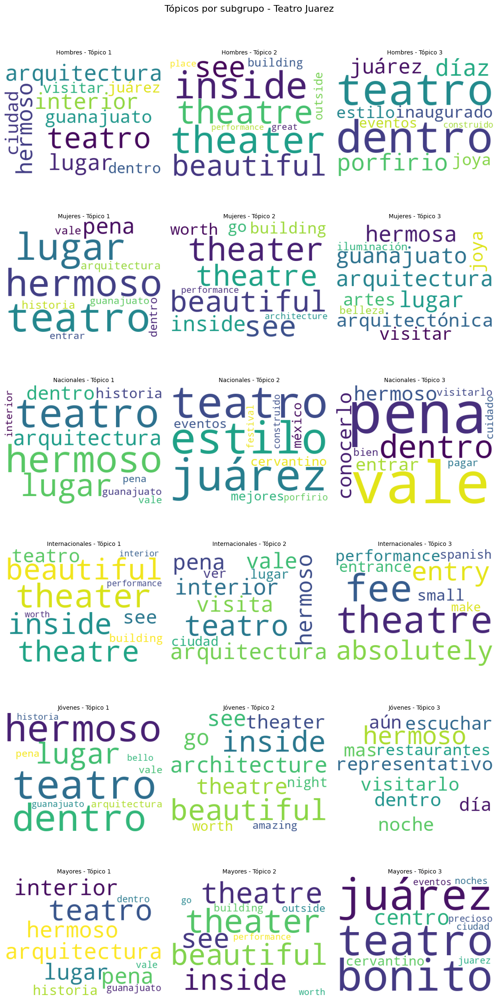

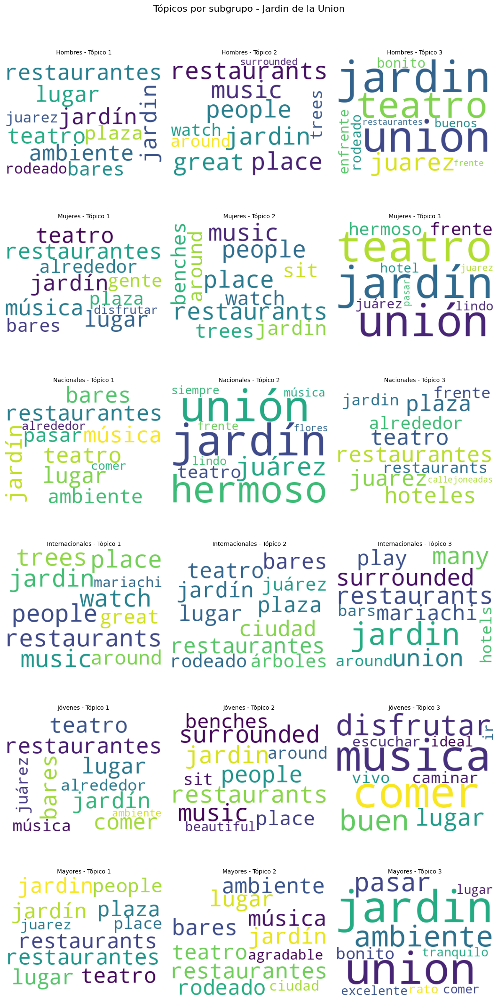

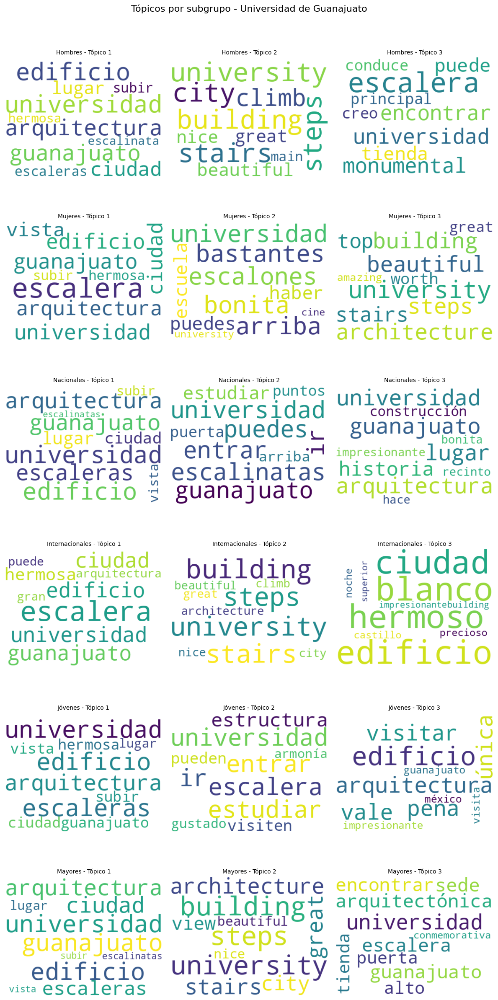

In [49]:
def mostrar_wordclouds_sitio(resultados, sitio):
    subgrupos = list(resultados[sitio].keys())
    n = len(subgrupos)
    topicos_por_subgrupo = 3  # Número de tópicos que estás visualizando

    fig, axes = plt.subplots(nrows=n, ncols=topicos_por_subgrupo, figsize=(topicos_por_subgrupo * 4, n * 4))

    if n == 1:
        axes = [axes]  # Asegura iterabilidad si solo hay un subgrupo

    for i, subgrupo in enumerate(subgrupos):
        topicos = resultados[sitio][subgrupo]
        for j in range(topicos_por_subgrupo):
            palabras = topicos[j][1]
            texto = ' '.join(palabras)
            wordcloud = WordCloud(width=400, height=300, background_color='white').generate(texto)
            ax = axes[i][j] if n > 1 else axes[0][j]
            ax.imshow(wordcloud, interpolation='bilinear')
            ax.axis('off')
            ax.set_title(f"{subgrupo} - {topicos[j][0]}", fontsize=10)

    plt.tight_layout()
    plt.suptitle(f"Tópicos por subgrupo - {sitio}", fontsize=16, y=1.02)
    plt.show()


for sitio in sitios:
    mostrar_wordclouds_sitio(results, sitio)

# Bolsas de Palabras combinadas

In [75]:
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.feature_extraction.text import TfidfVectorizer
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from scipy.sparse import hstack, vstack
import numpy as np

# Corregida: función de TF-IDF
def ngram_tfidf(X, ngram_range, stopwords, max_features=1000):
    vectorizer = TfidfVectorizer(ngram_range=ngram_range, stop_words=stopwords, max_features=max_features, norm='l2')
    X_vec = vectorizer.fit_transform(X)
    return X_vec, vectorizer

features = {}
labels = {}

for sitio in sitios:
    X_texts = splits_por_sitio[sitio]['X']
    
    X1, vec1 = ngram_tfidf(X_texts, (1, 1), all_stopwords, max_features=1000)
    X2, vec2 = ngram_tfidf(X_texts, (2, 2), all_stopwords, max_features=2000)
    X3, vec3 = ngram_tfidf(X_texts, (3, 3), all_stopwords, max_features=1000)

    X_combined = hstack([X1, X2, X3])
    
    features[sitio] = {
        'X': X_combined,
        'vectorizer': (vec1, vec2, vec3),
        'feature_names': list(vec1.get_feature_names_out()) + list(vec2.get_feature_names_out()) + list(vec3.get_feature_names_out())
    }
    
    labels[sitio] = np.array(splits_por_sitio[sitio]['y'])

X_tfidf_global = vstack([features[sitio]['X'] for sitio in sitios])
y_global = np.concatenate([labels[sitio] for sitio in sitios])
feature_names_global = []
for sitio in sitios:
    feature_names_global += features[sitio]['feature_names']

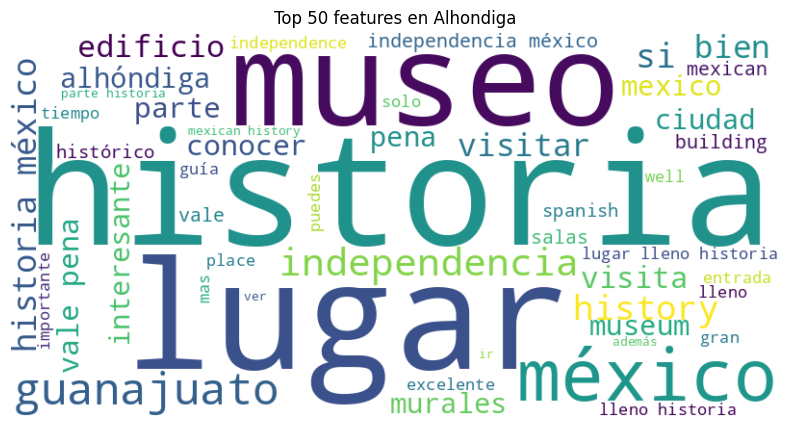

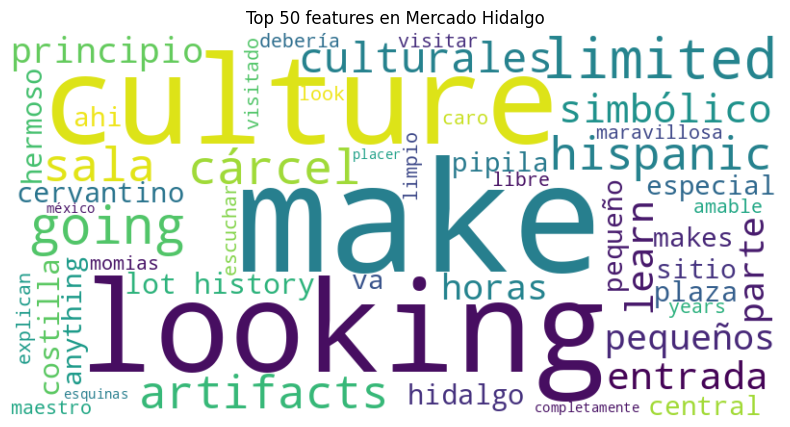

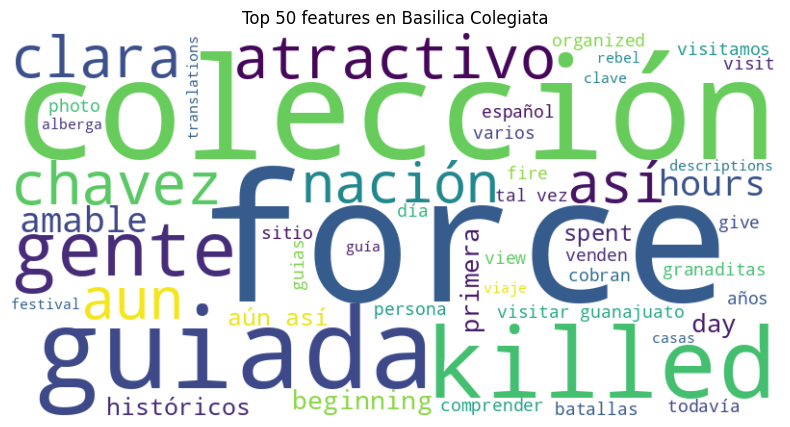

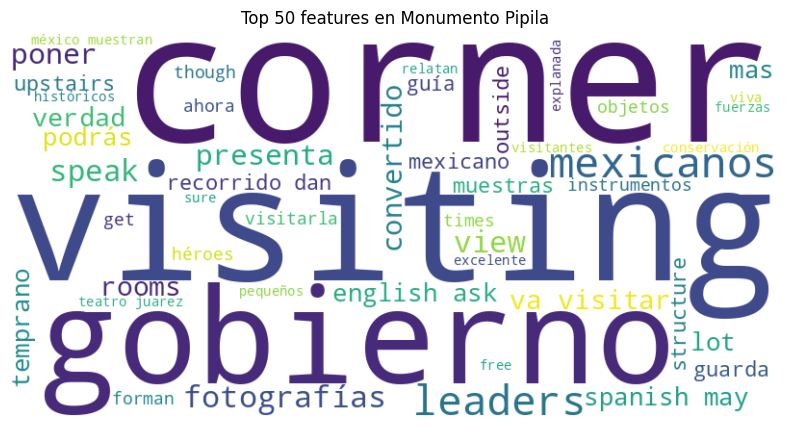

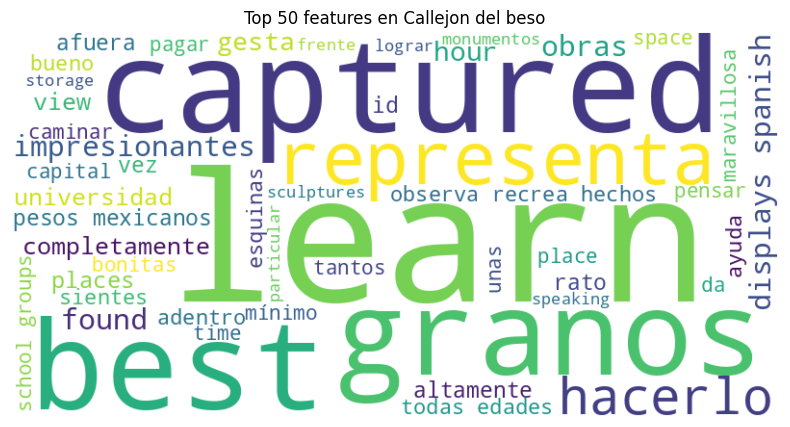

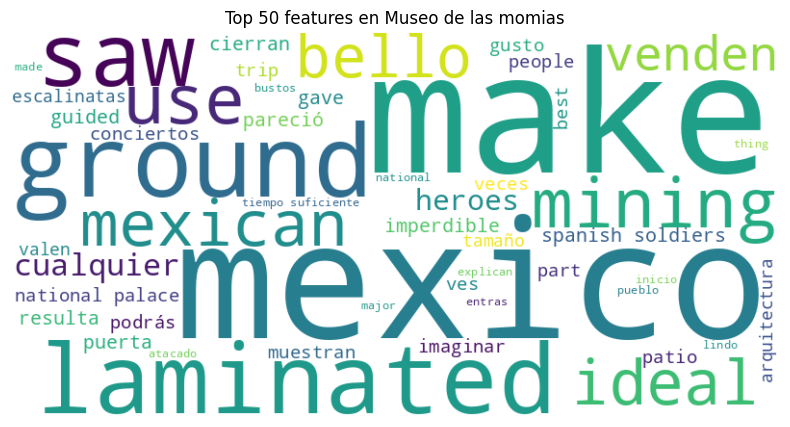

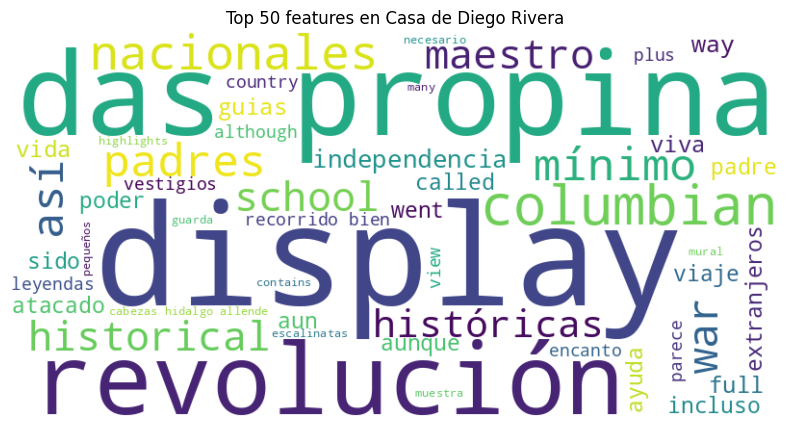

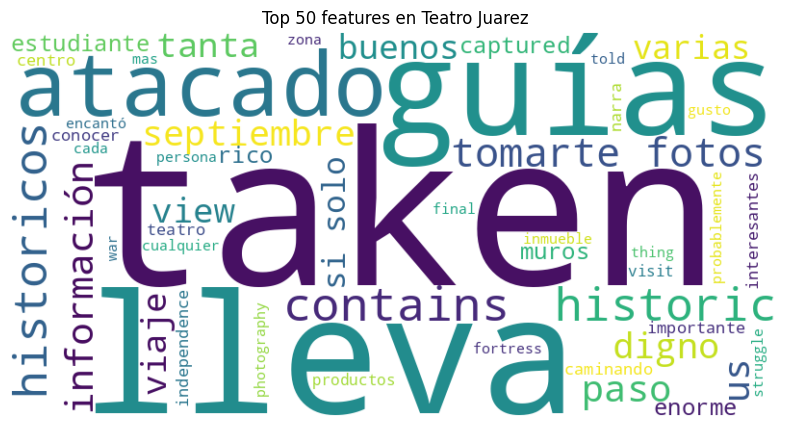

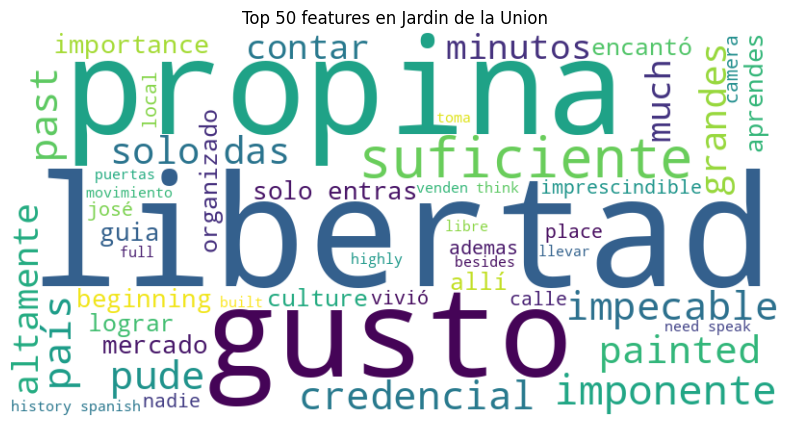

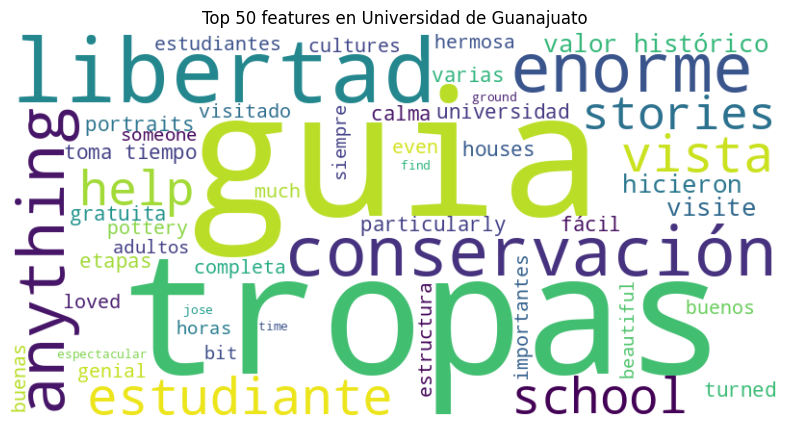

In [78]:
selector = SelectKBest(chi2, k=1000)
X_selected = selector.fit(X_tfidf_global, y_global)
mask = selector.get_support()
scores = selector.scores_[mask]
feature_names_global = features[sitios[0]]['feature_names']
top_features = np.array(feature_names_global)[mask]


from wordcloud import WordCloud
import matplotlib.pyplot as plt
import numpy as np

for sitio in sitios:
    X_sitio = features[sitio]['X'][:, mask]  # solo columnas seleccionadas globalmente
    feature_names_sitio = np.array(top_features)  # nombres de esos 1000 features

    # Obtener los pesos promedio por feature (promedio TF-IDF en ese sitio)
    mean_scores = np.array(X_sitio.mean(axis=0)).ravel()

    # Crear diccionario {feature: peso medio} solo si el peso es mayor a 0
    feature_score_dict = {
        name: score for name, score in zip(feature_names_sitio, mean_scores)
        if score > 0 and not np.isnan(score)
    }

    # Elegir top 50 por score
    top_items = dict(sorted(feature_score_dict.items(), key=lambda x: x[1], reverse=True)[:50])

    # Crear y mostrar WordCloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(top_items)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f"Top 50 features en {sitio}")
    plt.show()


# Analisis temporal

In [119]:
df['Fecha'] = pd.to_datetime(df['Fecha'], dayfirst=True, errors='coerce')
df.dropna(inplace=True)
df['mes'] = df['Fecha'].dt.month.astype(str)
df['año'] = df['Fecha'].dt.year.astype(int)
df['mes'] = df['mes'].replace({
    '1': 'Ene',
    '2': 'Feb',
    '3': 'Mar',
    '4': 'Abr',
    '5': 'May',
    '6': 'Jun',
    '7': 'Jul',
    '8': 'Ago',
    '9': 'Sep',
    '10': 'Oct',
    '11': 'Nov',
    '12': 'Dic'
})
orden_meses = [
    'Ene', 'Feb', 'Mar', 'Abr', 'May', 'Jun',
    'Jul', 'Ago', 'Sep', 'Oct', 'Nov', 'Dic'
]
df['mes'] = pd.Categorical(df['mes'], categories=orden_meses, ordered=True)
df['Calificación'] = df['Calificación'].replace({
    'Excelente': 'Positivo',
    'Muy bueno': 'Positivo',
    'Regular': 'Neutral',
    'Malo': 'Negativo',
    'Pésimo': 'Negativo'
})
df.head()

,Género,Edad,Nacional ó Internacional,Calificación,Escala,Número de aportaciones,Título de la opinión,Opinión,País,Idioma,Dispositivo,Fecha,Sitio,longitud_opinion,mes,año
0,Masculino,59.0,Nacional,Positivo,5,267.0,"""Gran sitio histórico""","Fue construida a finales del siglo XVIII, en e...",México,Español,Móvil,2018-06-19,Alhondiga,37,Jun,2018
1,Masculino,32.0,Nacional,Positivo,5,61.0,"""Excelente museo""",Parada obligatoria en tu visita a la ciudad de...,México,Español,PC,2018-06-19,Alhondiga,20,Jun,2018
2,Masculino,18.0,Nacional,Positivo,4,50.0,"""Presenciar el lugar de la tragedia""",En este lugar se dio una de las batallas mas l...,México,Español,PC,2018-06-05,Alhondiga,108,Jun,2018
3,Femenino,30.0,Internacional,Positivo,5,69.0,"""EL CORAZÓN DE LA HISTORIA DE MÉXICO""","Maravilloso sitio, muy gráfico para aprender h...",Perú,Español,PC,2018-06-03,Alhondiga,20,Jun,2018
4,Femenino,25.0,Nacional,Positivo,5,22.0,"""Viaje diver-cultural!!""",El término alhóndiga proviene del árabe y sign...,México,Español,PC,2018-05-29,Alhondiga,95,May,2018


In [110]:
df['Calificación'].unique()

array(['Positivo', 'Negativo', 'Neutral'], dtype=object)

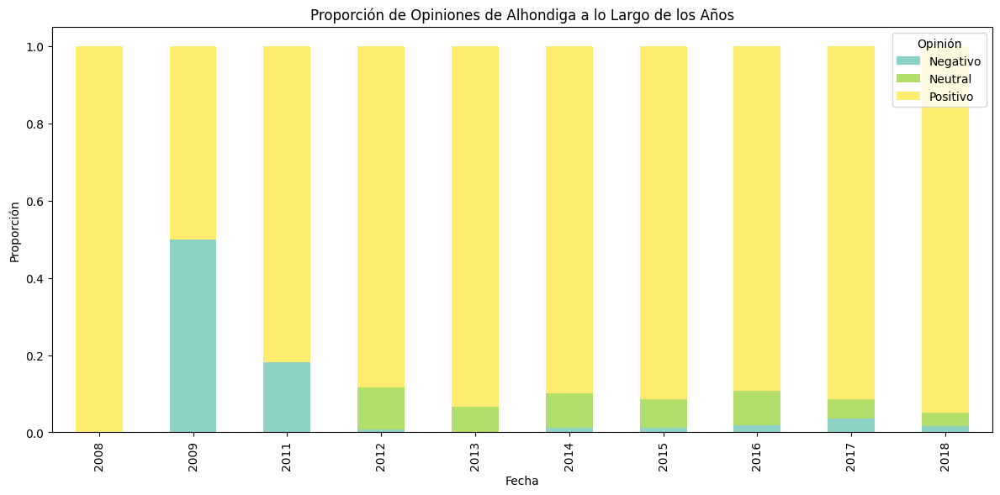

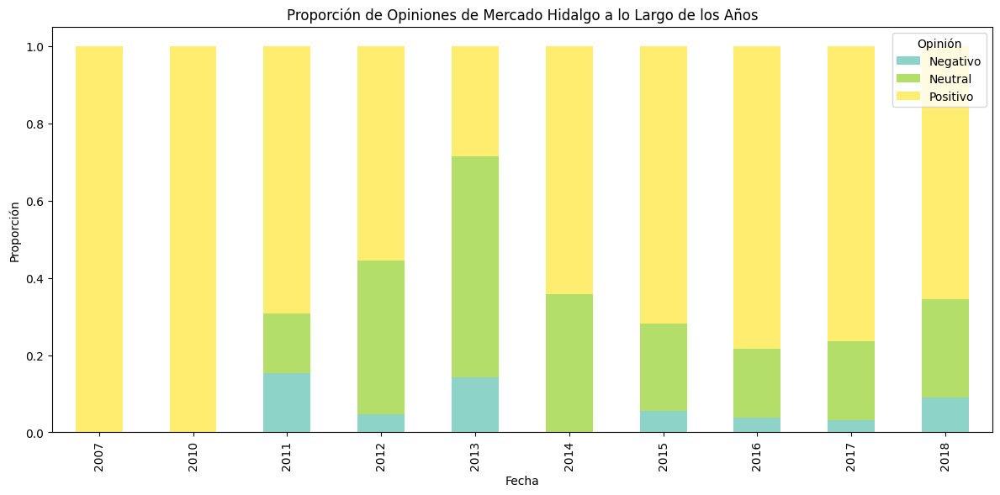

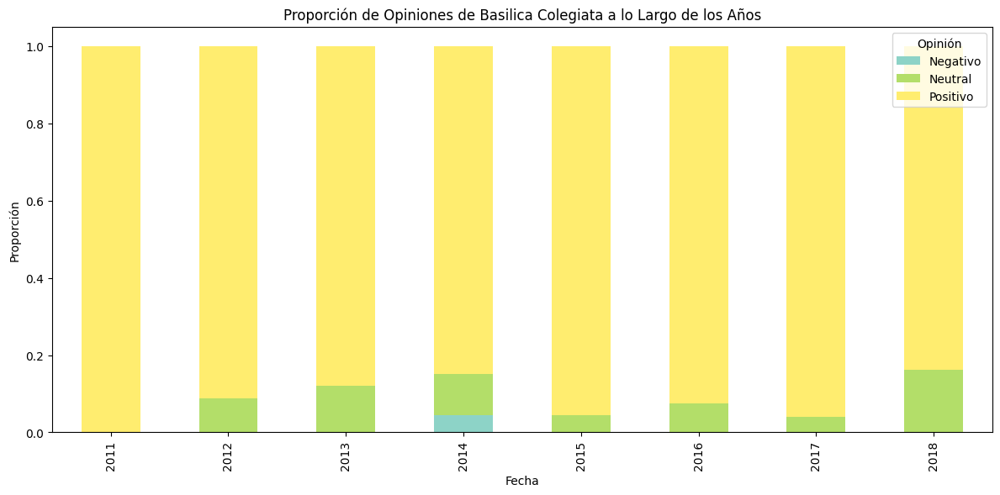

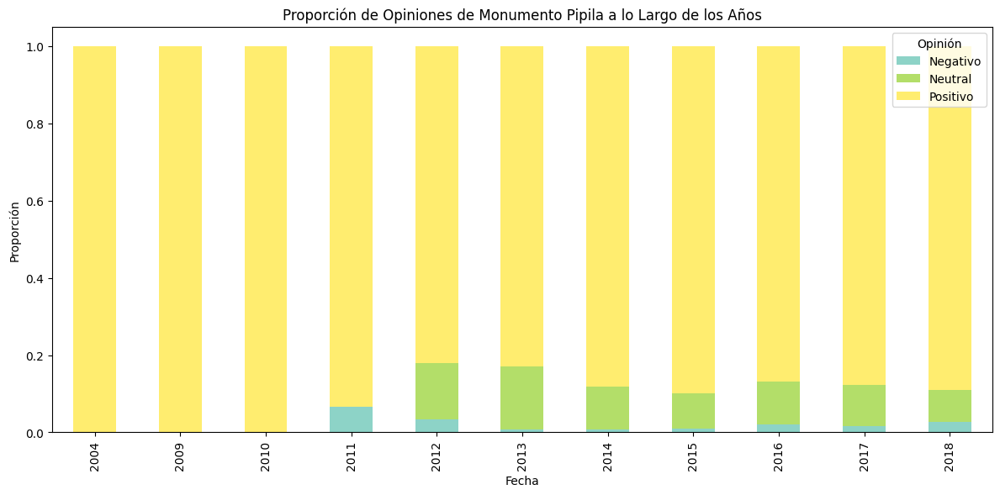

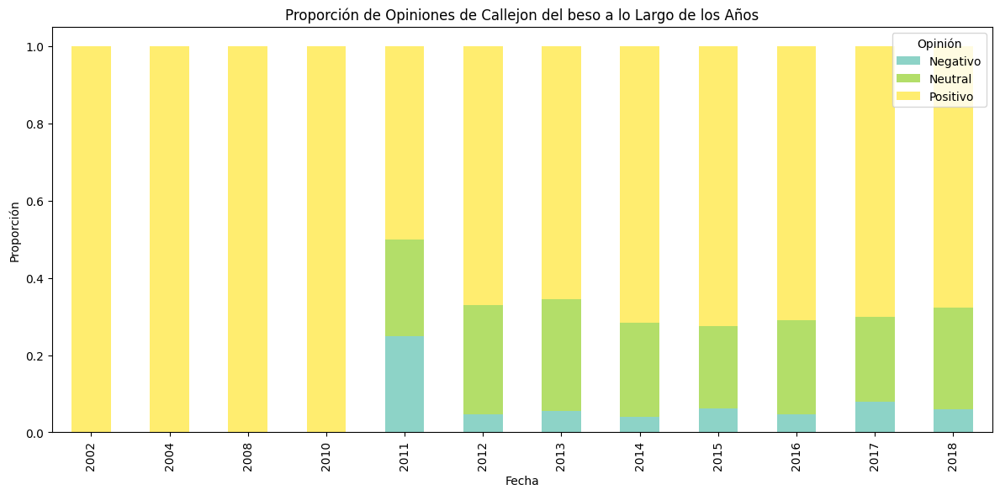

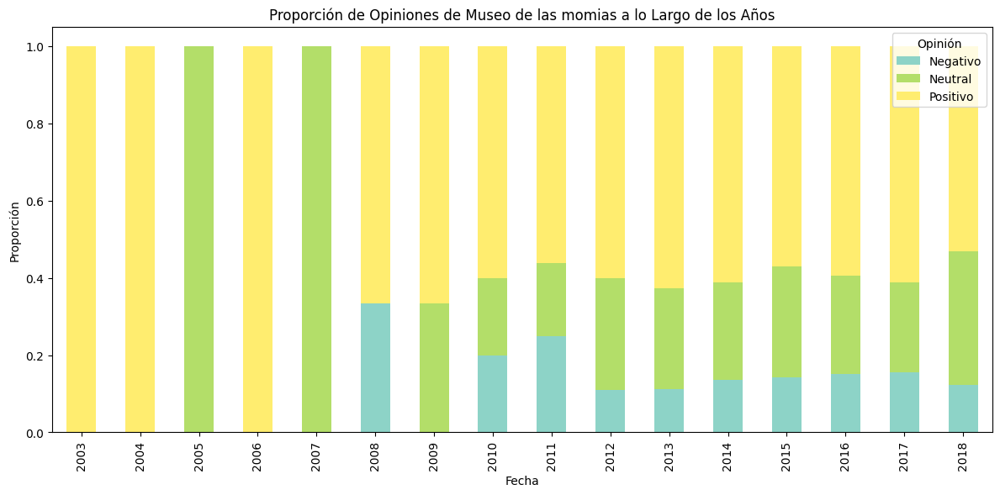

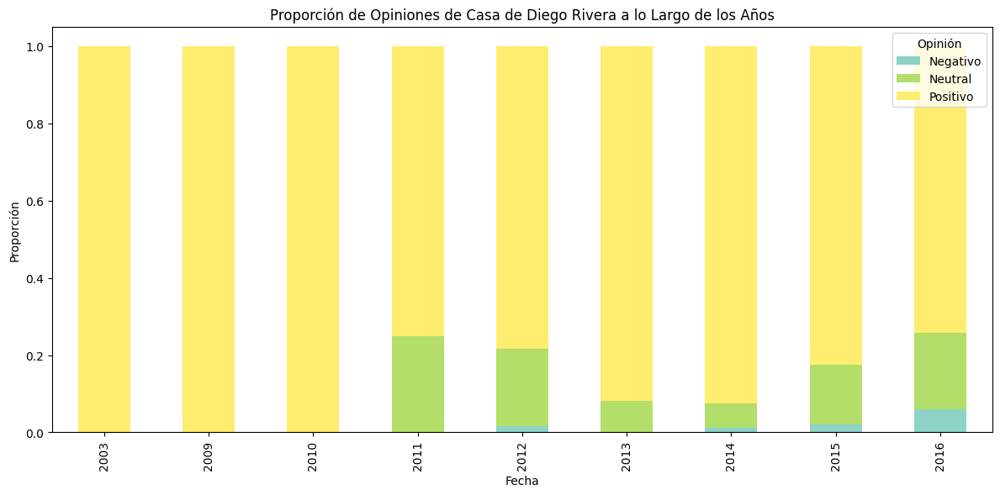

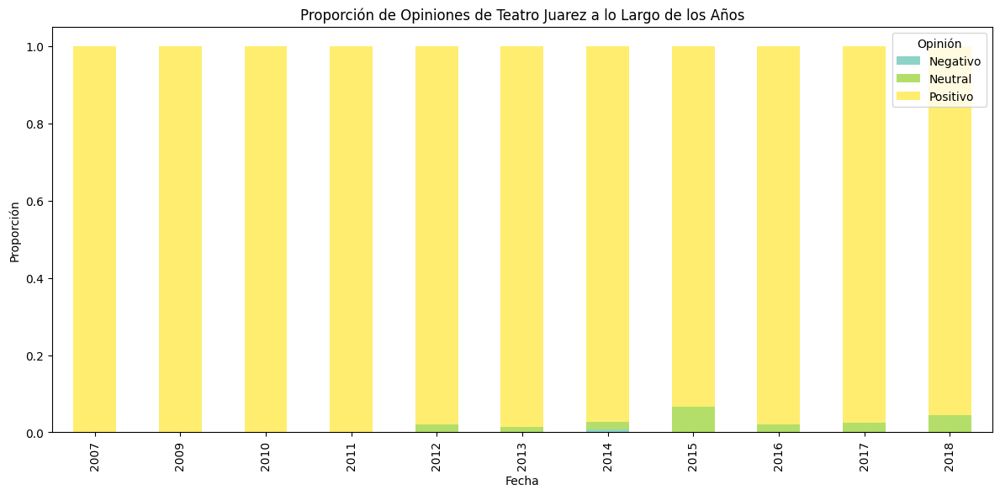

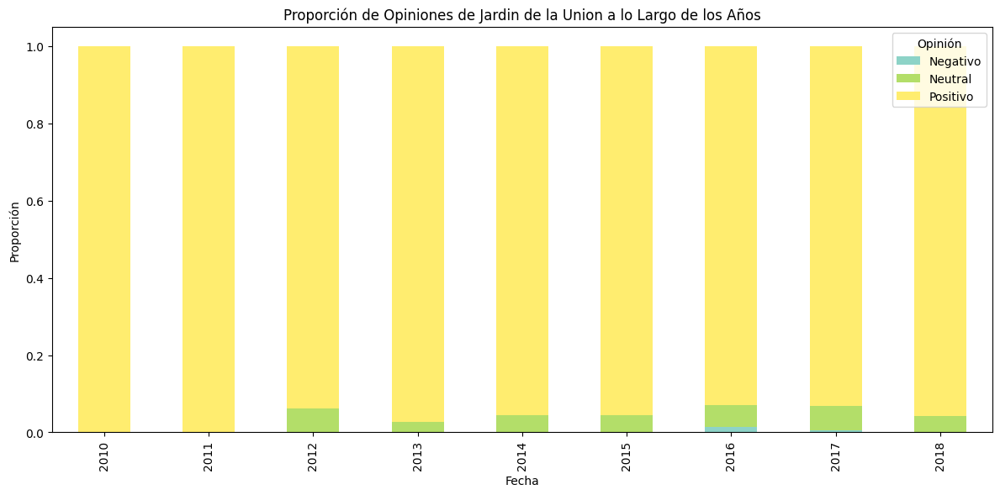

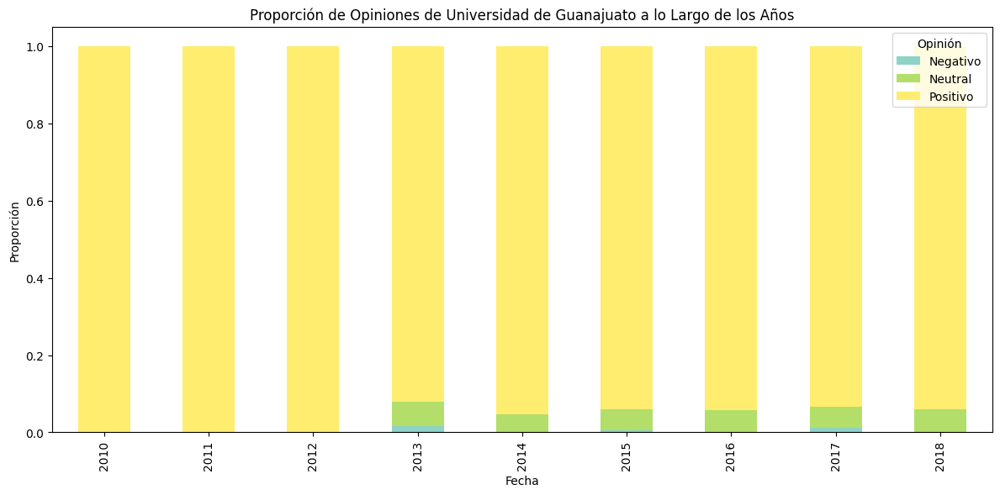

In [114]:
for sitio in sitios:
    df_sitio = df[df['Sitio'] == sitio]
    count = df_sitio.groupby(['año', 'Calificación']).size().unstack(fill_value=0)
    ratio = count.div(count.sum(axis=1), axis=0)
    orden_opiniones = ['Negativo', 'Neutral', 'Positivo']  # orden de abajo hacia arriba
    ratio = ratio[orden_opiniones]
    ratio.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='Set3')
    plt.title(f'Proporción de Opiniones de {sitio} a lo Largo de los Años')
    plt.xlabel('Fecha')
    plt.ylabel('Proporción')
    plt.legend(title='Opinión')
    plt.tight_layout()
    plt.show()

/tmp/ipykernel_6073/740646135.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count = df_sitio.groupby(['mes', 'Calificación']).size().unstack(fill_value=0)


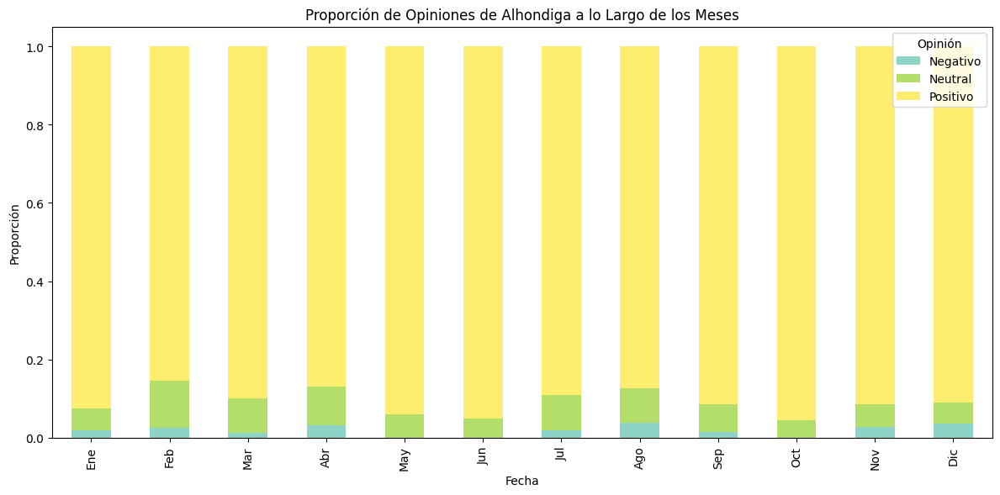

/tmp/ipykernel_6073/740646135.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count = df_sitio.groupby(['mes', 'Calificación']).size().unstack(fill_value=0)


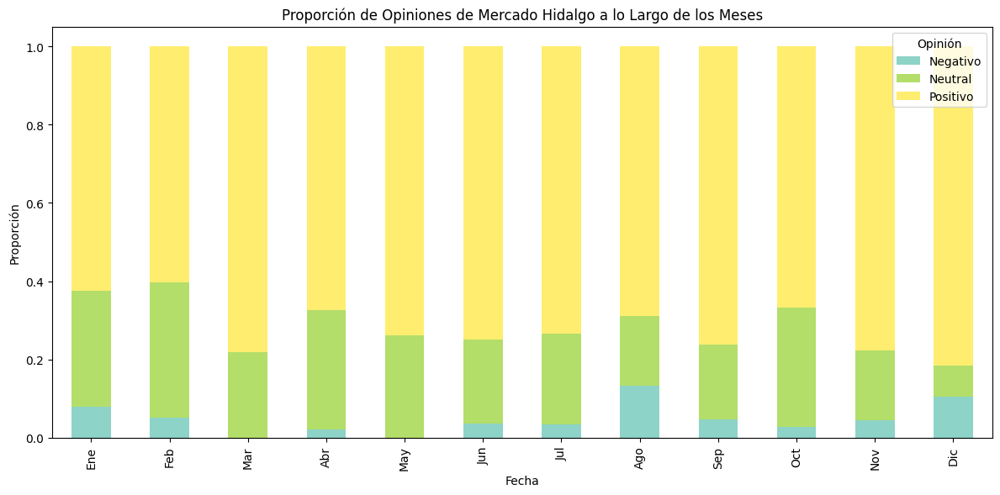

/tmp/ipykernel_6073/740646135.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count = df_sitio.groupby(['mes', 'Calificación']).size().unstack(fill_value=0)


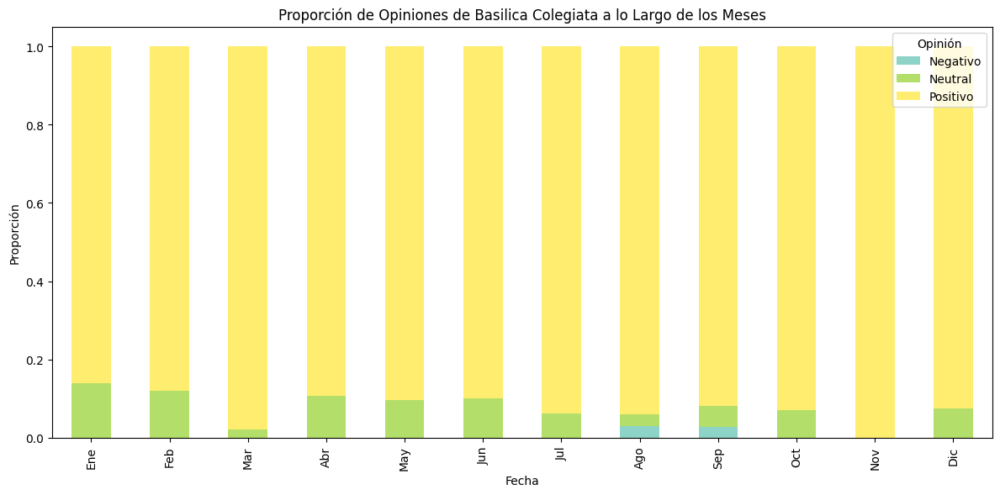

/tmp/ipykernel_6073/740646135.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count = df_sitio.groupby(['mes', 'Calificación']).size().unstack(fill_value=0)


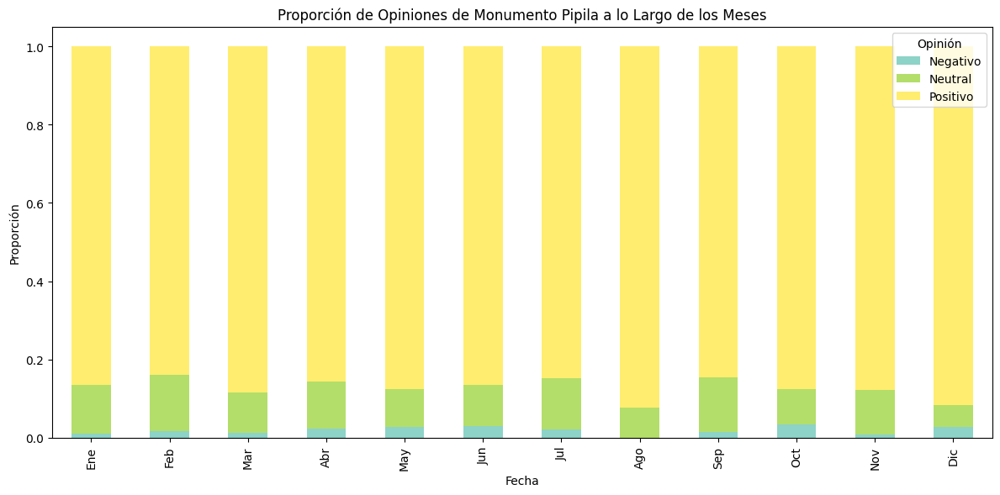

/tmp/ipykernel_6073/740646135.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count = df_sitio.groupby(['mes', 'Calificación']).size().unstack(fill_value=0)


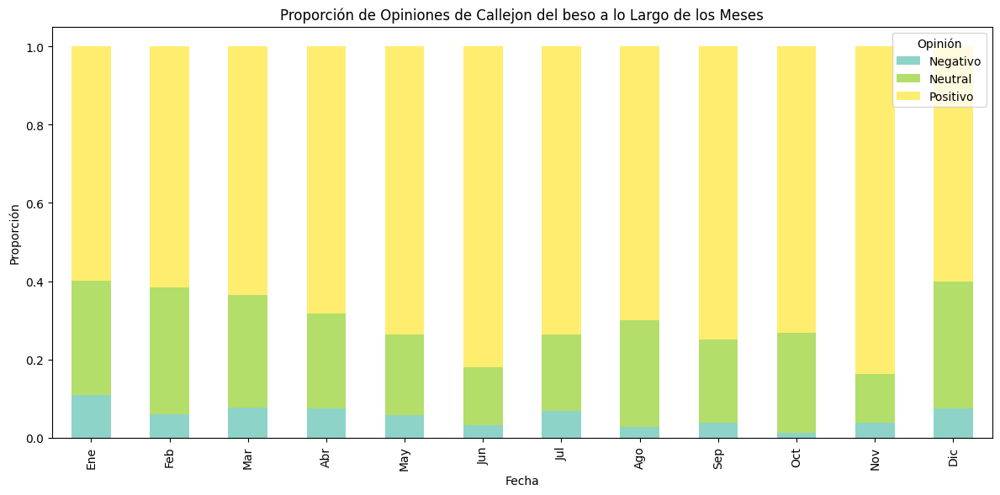

/tmp/ipykernel_6073/740646135.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count = df_sitio.groupby(['mes', 'Calificación']).size().unstack(fill_value=0)


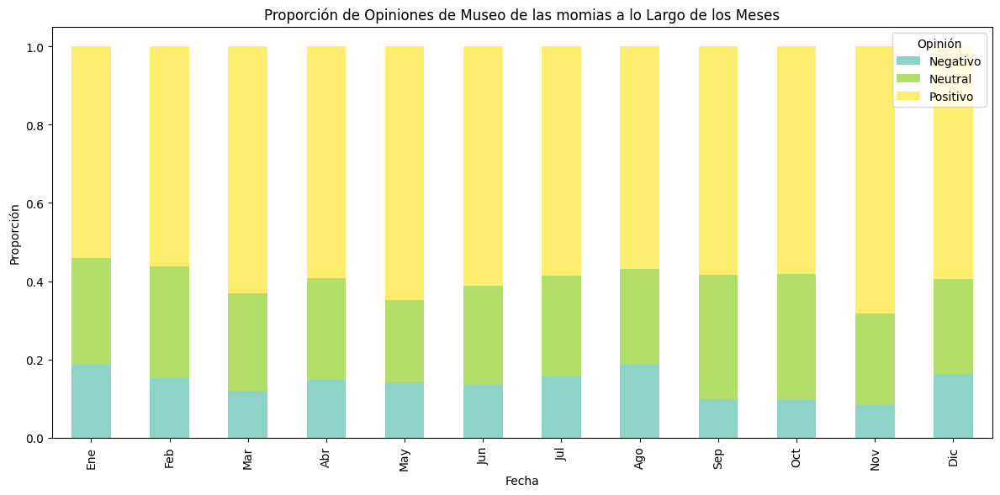

/tmp/ipykernel_6073/740646135.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count = df_sitio.groupby(['mes', 'Calificación']).size().unstack(fill_value=0)


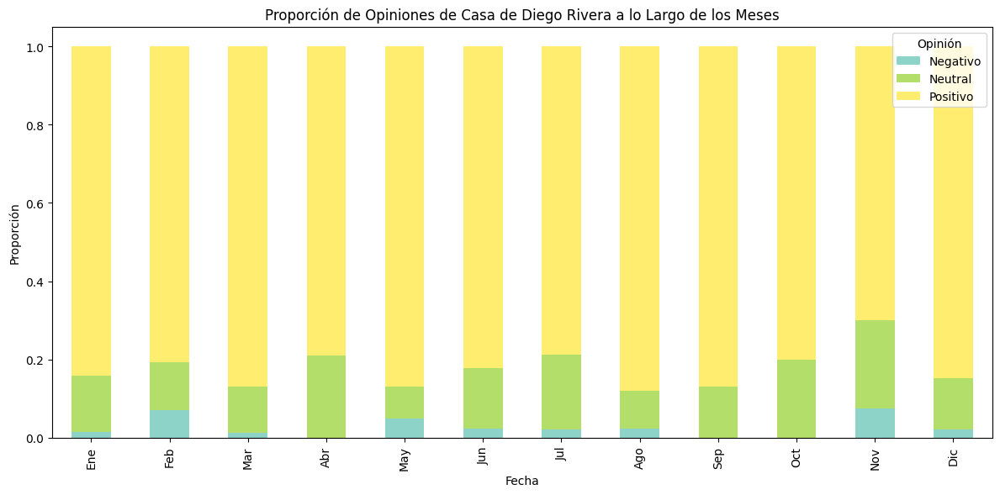

/tmp/ipykernel_6073/740646135.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count = df_sitio.groupby(['mes', 'Calificación']).size().unstack(fill_value=0)


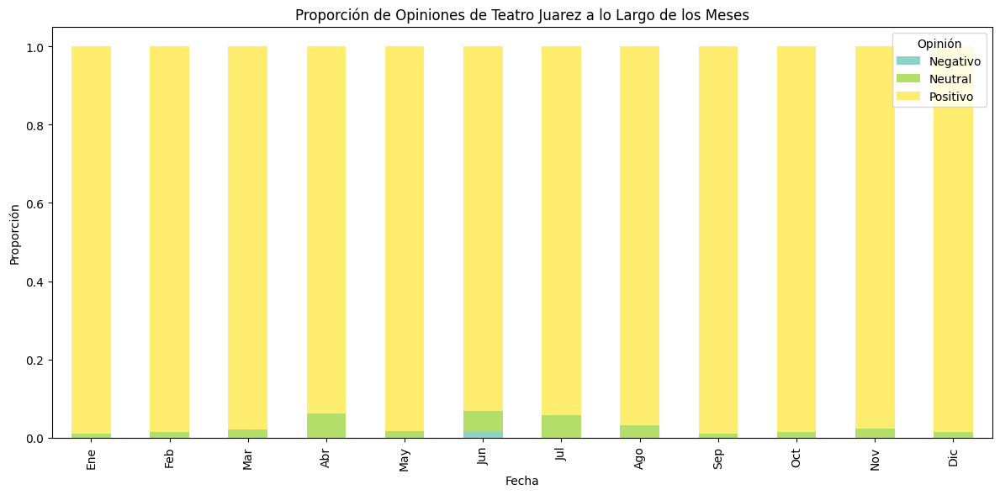

/tmp/ipykernel_6073/740646135.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count = df_sitio.groupby(['mes', 'Calificación']).size().unstack(fill_value=0)


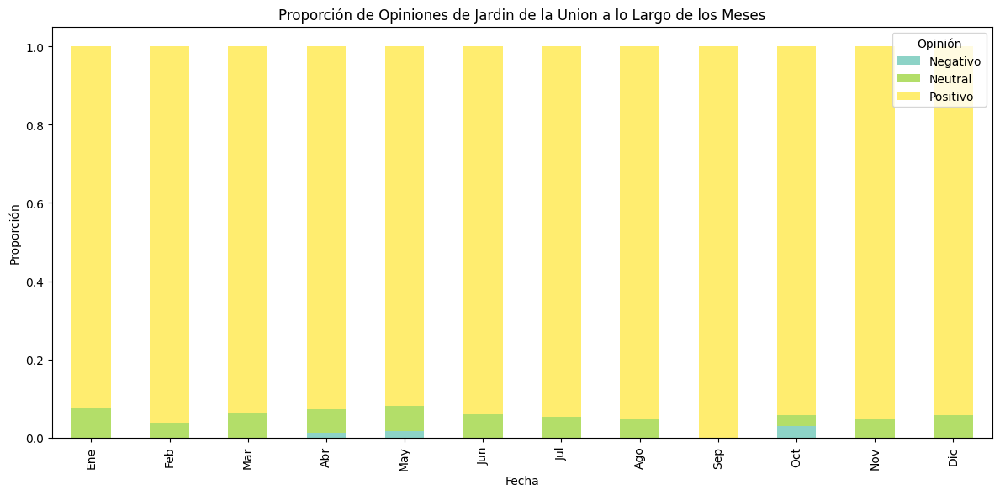

/tmp/ipykernel_6073/740646135.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  count = df_sitio.groupby(['mes', 'Calificación']).size().unstack(fill_value=0)


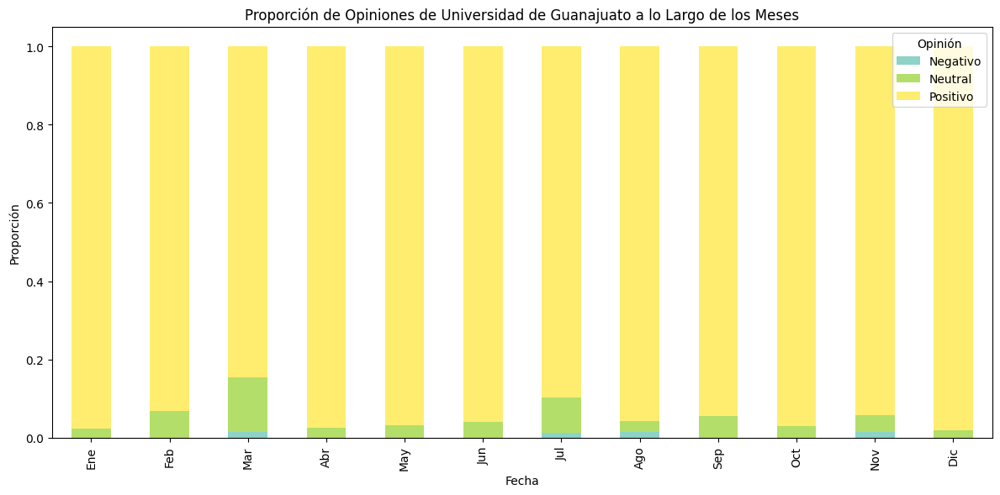

In [120]:
for sitio in sitios:
    df_sitio = df[df['Sitio'] == sitio]
    count = df_sitio.groupby(['mes', 'Calificación']).size().unstack(fill_value=0)
    ratio = count.div(count.sum(axis=1), axis=0)
    orden_opiniones = ['Negativo', 'Neutral', 'Positivo']  # orden de abajo hacia arriba
    ratio = ratio[orden_opiniones]
    ratio.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='Set3')
    plt.title(f'Proporción de Opiniones de {sitio} a lo Largo de los Meses')
    plt.xlabel('Fecha')
    plt.ylabel('Proporción')
    plt.legend(title='Opinión')
    plt.tight_layout()
    plt.show()

# Preguntas
1. ¿De los sitios turísticos, cual diría usted que es el más polémico y la razón de ello? 
    - Diria que es el museo de las momias, dado que tiene una cantidad considerable de opiniones negativas de manera muy consistente a lo largo de los años. Sin embargo, pareciera que estas opiniones negativas no se deben a que los visitantes odien el lugar, sino que esta relacionado a la manera en la que se sienten al recorrer el lugar. Esto se ve reflejado en el uso frecuente de palabras como “miedo”, “creepy” y “sad” en las opiniones, pero al analizar las palabras mas relevantes en los topicos para todos los subgrupos sociales se observan muchos adjetivos positivos, como “interesante” o “impresionante” usados de manera muy consistente, y al observar que en una gran parte de ellos la palabra “ver” tiene un uso prominente. De esta manera, el analisis pareciera sugerir que, aunque resulta una experiencia muy interesante para quienes lo visitan, la atmosfera sombria y la idea de ver cadaveres humanos reales provocan una incomodidad palpable en muchos de los visitantes
2. En cuanto al sitio más polémico, ¿Como es la diferencia de opinión y temas entre turistas nacionales e internacionales? 
    - No pareciera haber una diferencia considerable entre ambos tipos de turistas: entre los nacionales, el topico principal es la experiencia general como museo, centrandose en aspectos de su visita como el hecho de que les pareciera interesante; en segundo lugar, parecen centrarse en el estado de las momias, hablando con mucha frecuencia sobre su estado de conservacion a pesar de los anos que deben tener; finalmente, parecen centrarse mucho en el proceso por el que los cadaveres del panteon se convierten en momias, mencionando cosas como el proceso de momificacion y la deshidratacion de los cuerpos. Por su parte, los turistas internacionales parecen centrarse en temas similares, de nuevo haciendo enfasis en cosas como lo interesante que les parecio su visita al museo; algo notable es que el uso de palabras tan descriptivas es mucho menos comun entre ellos, mencionando unicamente palabras como “dead” y “cuerpos”, sin entrar en detallos sobre el proceso de momificacion
3. ¿Cual diría que es el sitio que le gusta más a las mujeres y por qué?
    - En el analisis de topicos, se observa que en la mayoria de las atracciones turisticas las opiniones parecen centrarse en la estetica del lugar o en lo interesante de la experiencia. El lugar que posee opiniones que contienen una descripcion mas detallada de sentimientos es el callejon del beso, donde se habla mucho de la atmosfera romantica que tiene, ademas de mencionar a la pareja, besarse, y hay muchas menciones de Romeo y Julieta, sugiriendo que produce una respuesta mas emocional en los visitantes, especialmente al considerar que la mayor parte de las personas que visitan el sitio van acompanadas de sus parejas especificamente por esa razon, volviendolo un lugar con una asociacion emocional mas grande que el solo disfrutar de, por ejemplo, la arquitectura del lugar o lo interesante del museo. Otro lugar en el que se menciona que disfrutaron de su visita es el jardin de la union, donde se mencionan las diferentes actividades que hay para hacer en el lugar.
4. ¿Cual diría que es el sitio que le gusta más a las personas jóvenes y por qué?
    - Una vez mas, en la mayoria de las atracciones turisticas los jovenes tienden a mencionar la estetica del lugar y lo interesante de los recorridos, los dos lugares en los que se da una opinion mas emocional son el callejon del beso y el jardin de la union: en el callejon nuevamente se hacen muchas menciones de parejas, de besos y sobre como disfrutaron la experiencia de las callejoneadas. Por su parte, en el jardin de la union nuevamente se hacen menciones a disfrutar las actividades que hay en los alrededores, aunque en su caso se hace un poco mas de enfasis en los bares, la musica en vivo, y mas que hacer mencion a disfrutar los restaurantes como lugares se hace especialmente enfasis en la acción de comer en el lugar
5. ¿Qué otras observaciones valiosas puede obtener de su análisis? (e.g., ¿identificó de que se queja la gente? ¿qué tipo de cosas le gustó a la gente?, etc.)
    - Como se menciono, muchas veces se hace especial enfasis en el disfrutar la arquitectura de los sitios, los lugares para comer y divertirse y lo interesante que le resulta a los visitantes la experiencia de visitar los museos. Por la proporcion tan abrumadoramente alta de opiniones positivas parece ser que son muy pocos los visitantes que tienen una mala experiencia en la ciudad, indicando lo bien adaptado que esta Guanajuato como centro turistico, y la gran cantidad de atracciones que resultan interesantes para todos los diferentes tipos de visitantes: sea cual sea su origen o edad, encuentran un sitio dentro de la ciudad el cual disfrutan y se van con una buena opinion. Algo que resulta curioso es que las personas que mas dejan opiniones sobre los sitios que visitan son las personas mayores, con la cantidad promedio de aportaciones de los usuarios creciendo conforme mayor es su edad. Por otra parte, resulta clara la mayor cantidad de opiniones de turistas extranjeros que deja su opinion, indicando posiblemente que el uso de este tipo de medios (o de esta pagina en particular) para compartir la experiencia de su visita es mucho mas popular entre los visitantes internacionales que entre los mexicanos